In [3]:
import numpy as np
import pandas as pd
import re

# Plotting tools
import matplotlib.pyplot as plt
%matplotlib inline

from joblib import dump, load

import logging

import gensim.corpora as corpora
import gensim.models.callbacks
from gensim.models import CoherenceModel
from gensim.utils import simple_preprocess

from tqdm.notebook import tqdm

In [4]:
import os
CORPUS_PATH="C:/PAN2/mp_poz/corpus_takipi/"
filenames = sorted([os.path.join(CORPUS_PATH, fn) for fn in os.listdir(CORPUS_PATH)])

In [3]:
labels=[]
texts=[]

texts=[]
labels=[]
for file in sorted(os.listdir(CORPUS_PATH)):
    labels.append(file)
    with open(os.path.join(CORPUS_PATH,file), newline='\n', encoding='utf8') as file: text=file.read()
    texts.append(text)

In [4]:
dump(labels, 'labels_mp_poz.joblib')

['labels_mp_poz.joblib']

In [5]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(list(gensim.utils.tokenize(str(sentence), deacc=False)))

In [6]:
data_words = list(sent_to_words(texts))

In [7]:
dump(data_words,'data_words_mp_poz.joblib')

['data_words_mp_poz.joblib']

In [8]:
with open('polish_stoplist_short.txt', newline='\n', encoding='utf8') as file: raw_stopwords=file.read()

temp_stopwords=raw_stopwords.split('\n')

stop_words=[]

for word in temp_stopwords:
    stop_words.append(word.lower())

In [98]:
!jupyter nbextension enable --py widgetsnbextension

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: ok


In [10]:
print("Removing stopwords...")
data_words_nostops=[]
for doc in tqdm(data_words):
    doc_temp=[]
    for word in doc:
        if word.lower() not in stop_words:
            doc_temp.append(word)
    data_words_nostops.append(doc_temp)

Removing stopwords...


  0%|          | 0/190 [00:00<?, ?it/s]

In [11]:
dump(data_words_nostops, 'data_words_nostops_mp_poz.joblib')

['data_words_nostops_mp_poz.joblib']

In [12]:
dump(data_words_nostops, 'data_lemmatized_mp_poz.joblib') #lemmatized previously with TakIPI

['data_lemmatized_mp_poz.joblib']

In [14]:
id2word = corpora.Dictionary(data_words_nostops)

stop_ids=[]

for id in (range(len(id2word))):
    if id2word[id] in stop_words:
        stop_ids.append(id)

id2word.filter_tokens(stop_ids)

In [21]:
dump(id2word, 'id2word_mp_poz.joblib')

['id2word_mp_poz.joblib']

In [16]:
# Create Corpus
#texts = data_lemmatized

texts_chunked=[]

def divide_chunks(l, n): 
      
    # looping till length l 
    for i in range(0, len(l), n):  
        yield l[i:i + n] 

# How many elements each list should have 

n = 100

for text in data_words_nostops:
    chunks=list(divide_chunks(text, n))
    for chunk in chunks:
        texts_chunked.append(chunk)

In [17]:
# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts_chunked]

In [18]:
dump(corpus, "corpus_mp_poz.joblib")

['corpus_mp_poz.joblib']

In [15]:
#TRAINING

In [5]:
data_lemmatized=load('data_lemmatized_mp_poz.joblib')
id2word=load('id2word_mp_poz.joblib')
corpus=load('corpus_mp_poz.joblib')
labels=load('labels_mp_poz.joblib')

In [3]:
len(data_lemmatized)

190

In [4]:
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO, filename='gensim_mpn.log')

In [ ]:
table=[]
for set_num_topics in tqdm(range(15,26)):
    
    current_row=[]
    
    for set_passes in tqdm(range(5,16)):
        
        lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=set_num_topics,
                                           random_state=100,
                                           update_every=1,
                                           #chunksize=100,
                                           passes=set_passes,
                                           iterations=1,
                                           alpha=0.8,
                                           eta=0.3, # beta in sklearn
                                           per_word_topics=True) 
        coherence_model_lda = CoherenceModel(model=lda_model, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
        coherence_lda = coherence_model_lda.get_coherence()
        current_row.append(coherence_lda)
    
    table.append(current_row)

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

In [ ]:
hor=[]
for a in range(15,25):
    hor.append(a)
    
ver=[]
for a in range(5,15):
    ver.append(a)

pd_table=pd.DataFrame(table, index=hor, columns=ver)

pd_table.to_csv('mp_poz_topics-passes.csv', index=False)  

In [24]:
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=21,
                                            random_state=100,
                                           update_every=1,
                                           #chunksize=100,
                                           passes=14,
                                           iterations=100,
                                           alpha=0.8,
                                           eta=0.3, # beta in sklearn
                                           per_word_topics=True) 

In [25]:
dump(lda_model, 'model_mp_poz_21t_14p_100i.joblib')

['model_mp_poz_21t_14p_100i.joblib']

In [26]:
keyw=lda_model.print_topics()
keyw.sort()

In [27]:
keyw

[(0,
  '0.024*"cezar" + 0.022*"oda" + 0.022*"dotąd" + 0.016*"List_świętego_Piotra" + 0.015*"ofiara" + 0.014*"spodziewać" + 0.010*"niezwykły" + 0.009*"doznać" + 0.009*"cha" + 0.009*"nera"'),
 (1,
  '0.075*"stary" + 0.029*"młody" + 0.017*"brat" + 0.017*"dawny" + 0.014*"jeść" + 0.011*"począć" + 0.011*"wiek" + 0.010*"towarzysz" + 0.010*"oda" + 0.010*"słuchać"'),
 (2,
  '0.024*"drzwi" + 0.022*"pokój" + 0.020*"okno" + 0.016*"wejść" + 0.013*"dom" + 0.013*"spać" + 0.011*"otworzyć" + 0.009*"siedzieć" + 0.008*"ściana" + 0.008*"godzina"'),
 (3,
  '0.019*"dać" + 0.017*"mieć" + 0.017*"bóg" + 0.011*"Ala" + 0.010*"wziąć" + 0.010*"mówić" + 0.009*"dobry" + 0.009*"pójść" + 0.008*"chłop" + 0.008*"oda"'),
 (4,
  '0.012*"począć" + 0.011*"ogień" + 0.009*"drugi" + 0.009*"bić" + 0.008*"pies" + 0.007*"krzyk" + 0.007*"noga" + 0.007*"krzyczeć" + 0.007*"krew" + 0.006*"wszystek"'),
 (6,
  '0.061*"niby" + 0.021*"niekiedy" + 0.018*"lada" + 0.017*"jąć" + 0.017*"por" + 0.017*"ruszać" + 0.013*"metr" + 0.011*"nigdzie" +

In [29]:
doc_wyniki=[]
for topicno in range(0,len(keyw)):
        doc_wyniki.append(rolling_topic_gensim(doc_words, topicno, 30))

NameError: name 'rolling_topic_gensim' is not defined

In [28]:
#dominant topics in texts

topicscores=[]

for text in (data_lemmatized):
    doc_vectorized=id2word.doc2bow(text)
    topic_probability_scores = lda_model.get_document_topics(doc_vectorized, minimum_probability=0)    
    #scores=[]
    #for element in topic_probability_scores:
    #    scores.append(element[1])
    topicscores.append(topic_probability_scores)

In [29]:
len(topicscores[0])

21

In [30]:
sorted(topicscores[0], key=lambda x: x[1], reverse=True)

[(12, 0.21598397),
 (20, 0.13619588),
 (17, 0.07670088),
 (19, 0.071027786),
 (18, 0.057908196),
 (16, 0.055915672),
 (15, 0.05207108),
 (1, 0.045216933),
 (13, 0.036878567),
 (3, 0.0346683),
 (8, 0.03094581),
 (7, 0.030871449),
 (4, 0.028195148),
 (11, 0.02528685),
 (0, 0.024195079),
 (14, 0.015925314),
 (5, 0.014107476),
 (9, 0.01283275),
 (2, 0.012566402),
 (6, 0.011719862),
 (10, 0.010786607)]

In [31]:
topicscores_sorted=[]

for scores in topicscores:
    topicscores_sorted.append(sorted(scores, key=lambda x: x[1], reverse=True))

In [32]:
topicscores_sorted

[[(12, 0.21598397),
  (20, 0.13619588),
  (17, 0.07670088),
  (19, 0.071027786),
  (18, 0.057908196),
  (16, 0.055915672),
  (15, 0.05207108),
  (1, 0.045216933),
  (13, 0.036878567),
  (3, 0.0346683),
  (8, 0.03094581),
  (7, 0.030871449),
  (4, 0.028195148),
  (11, 0.02528685),
  (0, 0.024195079),
  (14, 0.015925314),
  (5, 0.014107476),
  (9, 0.01283275),
  (2, 0.012566402),
  (6, 0.011719862),
  (10, 0.010786607)],
 [(5, 0.16358323),
  (12, 0.12919076),
  (8, 0.08855629),
  (13, 0.06932911),
  (2, 0.06429356),
  (19, 0.061361358),
  (17, 0.060894188),
  (4, 0.052531827),
  (3, 0.047668364),
  (9, 0.04619913),
  (14, 0.045718424),
  (7, 0.04486407),
  (15, 0.025573941),
  (10, 0.02175484),
  (1, 0.02019589),
  (11, 0.016888076),
  (18, 0.015705917),
  (16, 0.009442924),
  (0, 0.007013126),
  (6, 0.005173648),
  (20, 0.0040612733)],
 [(20, 0.21013267),
  (12, 0.19453053),
  (17, 0.06534187),
  (18, 0.059401456),
  (15, 0.055862576),
  (19, 0.050187),
  (4, 0.045565758),
  (1, 0.04290

In [33]:
topicscores_books=[]

for bookno in range(len(labels)):
    #print(labels[bookno], topicscores_sorted[bookno][0][0])
    currentbook=[]
    currentbook.append(labels[bookno])
    currentbook.append(topicscores_sorted[bookno][0][0])
    currentbook.append(topicscores_sorted[bookno][1][0])
    currentbook.append(topicscores_sorted[bookno][2][0])
    topicscores_books.append(currentbook)

In [34]:
topicscores_books

[['MP_Berent_Diogenes w kontuszu_1937.txt', 12, 20, 17],
 ['MP_Berent_Fachowiec_1895.txt', 5, 12, 8],
 ['MP_Berent_Nurt_1934.txt', 20, 12, 17],
 ['MP_Berent_Ozimina_1911.txt', 7, 8, 12],
 ['MP_Berent_Próchno_1903.txt', 8, 15, 12],
 ['MP_Berent_Żywe kamienie_1918.txt', 16, 15, 14],
 ['MP_Grabiński_Błędny pociąg.txt', 12, 13, 17],
 ['MP_Grabiński_Cień Bafometa_1926.txt', 12, 14, 7],
 ['MP_Grabiński_Salamandra_1924.txt', 12, 14, 8],
 ['MP_Grabiński_Wyspa Itongo_1936.txt', 14, 12, 17],
 ['MP_Lange_Elfryda-Nowele i fantazje_1912.txt', 12, 17, 5],
 ['MP_Lange_Nowy Tarzan-Opowiadania wesołe i niewesołe_1925.txt', 12, 17, 5],
 ['MP_Lange_W czwartym wymiarze_1912.txt', 12, 15, 17],
 ['MP_Leśmian_Klechdy polskie_1956.txt', 12, 8, 14],
 ['MP_Leśmian_Klechdy sezamowe_1913.txt', 5, 14, 13],
 ['MP_Leśmian_Przygody Sindbada Żeglarza_1913.txt', 17, 14, 5],
 ['MP_Liciński_Halucynacje_1911.txt', 15, 5, 8],
 ['MP_Liciński_Z pamietnika włóczęgi_1908.txt', 15, 4, 3],
 ['MP_Miciński_Dęby czarnobylskie_1911.

In [7]:
for text in data_lemmatized:
    count=0
    for word in text:
        if word=='cezar':
            count=count+1
    print(count)

0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
1
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
4
0
0
0
0
0
0
0
0
0
0
0
0
0
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
8
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
1
0
0
0
0
0
0
0
2
521
0
0
0
0
0
0


In [38]:
#version which defines number of steps and divides the text into chunks based on its length
def rolling_topic_chunk(text, no_topic, steps):
    results=[]
    
    no_steps=steps
    step=int(len(text)/no_steps)
    window_size=int(len(text)/(no_steps-1))

    chunks=[]

    for counter in range(no_steps):
        chunk=[]
        chunk=text[counter*step:(counter*step+window_size)]
        chunk_vectorized = id2word.doc2bow(chunk)
        chunks.append(chunk)
        topic_probability_scores = lda_model.get_document_topics(chunk_vectorized, minimum_probability=0)
        results.append(topic_probability_scores[no_topic][1]) # <-- topic number to check, defined above
        #print(counter, '/', no_steps)
        #clear_output()
    return results, chunks

In [39]:
#version which defines number of steps and divides the text into chunks based on its length
def rolling_topic_gensim(text, no_topic, steps):
    results=[]
    
    no_steps=steps
    step=int(len(text)/no_steps)
    window_size=int(len(text)/(no_steps-1))

    for counter in range(no_steps):
        chunk=[]
        chunk=text[counter*step:(counter*step+window_size)]
        chunk_vectorized = id2word.doc2bow(chunk)
        topic_probability_scores = lda_model.get_document_topics(chunk_vectorized, minimum_probability=0)
        results.append(topic_probability_scores[no_topic][1]) # <-- topic number to check, defined above
        #print(counter, '/', no_steps)
        #clear_output()
    return results

In [40]:
wynik=rolling_topic_chunk(data_lemmatized[0], 16, 30)

In [41]:
for counter in range(0, len(wynik[0])):
    print(counter, wynik[0][counter])

0 0.20967151
1 0.1742282
2 0.123111844
3 0.21181913
4 0.35531384
5 0.13331002
6 0.30853605
7 0.37170163
8 0.3954528
9 0.37210348
10 0.3310538
11 0.21991281
12 0.3073526
13 0.4379825
14 0.22410385
15 0.36153567
16 0.38084346
17 0.42851222
18 0.3558079
19 0.23962905
20 0.30794984
21 0.22165938
22 0.31870106
23 0.3758526
24 0.33011797
25 0.29970634
26 0.26357302
27 0.42600483
28 0.31815115
29 0.25650373


In [42]:
wynik[1][21]

['piesek',
 'wziąć',
 'wprost',
 'siebie',
 'odtąd',
 'cień',
 'chodzić',
 'panna',
 'wystawać',
 'okno',
 'zima',
 'algierka',
 'gwałt',
 'drapować',
 'kształty',
 'bandycki',
 'płaszcz',
 'cień',
 'zarysować',
 'zamarzły',
 'szyba',
 'pewny',
 'troskliwość',
 'wyglądać',
 'dawać',
 'znak',
 'porozumienie',
 'telegraficzny',
 'wyznanie',
 'poetyczny',
 'miłość',
 'licować',
 'chodzenie',
 'szkoła',
 'coraz',
 'oddawać',
 'proza',
 'życie',
 'rzeczywisty',
 'zajęcia',
 'pomścić',
 'wzgarda',
 'odzienie',
 'coraz',
 'trzymać',
 'kupa',
 'żołądek',
 'coraz',
 'dopominać',
 'prawy',
 'zaspokojenie',
 'buntować',
 'mruczeć',
 'żołądek',
 'dzień',
 'wybrać',
 'garnek',
 'algierka',
 'miasto',
 'bułka',
 'maślanka',
 'specyjał',
 'uszczuplić',
 'fundusz',
 'pozwalać',
 'Kieda',
 'wracać',
 'siebie',
 'dźwigać',
 'algierka',
 'para',
 'kwart',
 'biały',
 'nektar',
 'spostrzec',
 'iść',
 'ulica',
 'ideał',
 'krew',
 'uderzyć',
 'głowa',
 'oko',
 'zaćmić',
 'oda',
 'wzruszenie',
 'radość',
 'za

In [111]:
wynik10=rolling_topic_chunk(data_lemmatized[0], 10, 30)

In [118]:
for counter in range(0, len(wynik10[0])):
    print(counter, wynik10[0][counter])

0 0.021358054
1 0.0031675736
2 0.065212585
3 0.023515947
4 0.15515403
5 0.05196095
6 0.019983381
7 0.0156157175
8 0.16964446
9 0.11899062
10 0.025948357
11 0.059817735
12 0.018873522
13 0.0026017472
14 0.14083263
15 0.20216368
16 0.014016813
17 0.016163908
18 0.012782411
19 0.037175745
20 0.016378969
21 0.0054426854
22 0.004849754
23 0.0074307146
24 0.0024811076
25 0.0069008972
26 0.0053953747
27 0.009951952
28 0.004469515
29 0.018039927


In [119]:
wynik10[1][15]

['brzęk',
 'ziemia',
 'wnet',
 'znaleźć',
 'drabina',
 'czarny',
 'postać',
 'kot',
 'wdrapać',
 'góra',
 'siekiera',
 'belka',
 'zwać',
 'kawałek',
 'mur',
 'stoczyć',
 'środek',
 'czerwony',
 'rozlać',
 'podwórze',
 'znikać',
 'nagle',
 'chwila',
 'znajdywać',
 'znajdować',
 'ciemność',
 'drugi',
 'budynek',
 'strzelić',
 'góra',
 'chwycić',
 'odraz',
 'górny',
 'belka',
 'wpaść',
 'dach',
 'spędzić',
 'stamtąd',
 'strażak',
 'zahuczeć',
 'brama',
 'komenda',
 'woda',
 'polać',
 'szum',
 'wołać',
 'fachowiec',
 'mara',
 'nieść',
 'sczerniały',
 'belka',
 'znaczyć',
 'myśleć',
 'podchodzić',
 'blisko',
 'ludzki',
 'trup',
 'skurczyć',
 'zmalały',
 'trup',
 'dziecko',
 'blaszanka',
 'trzymać',
 'ścisnąć',
 'pięść',
 'drugi',
 'mara',
 'człowiek',
 'żywy',
 'właściwie',
 'wyć',
 'ból',
 'pompa',
 'gapie',
 'huknąć',
 'oglądać',
 'pompa',
 'chwytać',
 'ramię',
 'człowiek',
 'widzieć',
 'słyszeć',
 'czuć',
 'siła',
 'ciągnąć',
 'ramię',
 'czas',
 'czas',
 'oślepić',
 'śnieg',
 'nagle',
 '

In [44]:
wyniki=[]

for textno in tqdm(range(0, len(data_lemmatized))):
    rolling_topics=[]
    for topicno in range(0,len(keyw)):
        rolling_topics.append(rolling_topic_gensim(data_lemmatized[textno], topicno, 30))
    wyniki.append(rolling_topics)

  0%|          | 0/87 [00:00<?, ?it/s]

In [45]:
dump(wyniki, 'wyniki_poz.joblib')

['wyniki_poz.joblib']

In [46]:
wyniki[0][16]

[0.20967354,
 0.17423043,
 0.12311276,
 0.2118217,
 0.35531598,
 0.13330735,
 0.3085372,
 0.37169915,
 0.39545825,
 0.3721031,
 0.33105516,
 0.21991412,
 0.30735198,
 0.43798316,
 0.22410898,
 0.36153463,
 0.38084593,
 0.4285131,
 0.35580748,
 0.23962808,
 0.30795547,
 0.2216585,
 0.31870145,
 0.375852,
 0.33011943,
 0.2997065,
 0.2635731,
 0.42600545,
 0.31815258,
 0.25650844]

In [47]:
tmp=pd.DataFrame(wyniki[0]).T

In [115]:
labels=load('labels_mpn.joblib')

In [116]:
len(labels)

88

In [67]:
keyw=lda_model.show_topics(num_topics=21, num_words=5, formatted=True)

In [68]:
keyw.sort()

In [69]:
len(keyw)

21

In [70]:
keyw

[(0,
  '0.005*"szkolny" + 0.005*"zarabiać" + 0.005*"aresztować" + 0.003*"zbójca" + 0.003*"telegram"'),
 (1,
  '0.021*"bądź" + 0.015*"zdziwić" + 0.012*"diabeł" + 0.009*"zdziwienie" + 0.009*"widzenie"'),
 (2,
  '0.031*"grać" + 0.022*"śpiewać" + 0.020*"dźwięk" + 0.018*"muzyka" + 0.015*"pieśń"'),
 (3,
  '0.014*"ciąć" + 0.010*"ryba" + 0.009*"sieć" + 0.008*"okręt" + 0.007*"rybak"'),
 (4,
  '0.018*"czytać" + 0.016*"książka" + 0.013*"pisać" + 0.012*"polski" + 0.011*"język"'),
 (5,
  '0.010*"drzwi" + 0.008*"stać" + 0.007*"ręka" + 0.007*"okno" + 0.006*"twarz"'),
 (6,
  '0.013*"człowiek" + 0.009*"rzecz" + 0.008*"należeć" + 0.006*"wielki" + 0.006*"pewny"'),
 (7,
  '0.019*"ksiądz" + 0.013*"bóg" + 0.012*"jeść" + 0.011*"znosić" + 0.010*"chleb"'),
 (8,
  '0.007*"upływać" + 0.004*"kamyk" + 0.003*"wysuszyć" + 0.002*"przyrządzać" + 0.002*"walor"'),
 (9,
  '0.029*"oko" + 0.019*"ręka" + 0.017*"chwila" + 0.015*"głowa" + 0.013*"stać"'),
 (10,
  '0.011*"słońce" + 0.009*"góra" + 0.008*"woda" + 0.007*"ziemia" +

In [71]:
topicwords=[]

for topic in range(len(keyw)):
    words=[]
    for word in keyw[topic][1].split('+'):
        words.append(re.search('"(.+?)"', word).group(1))
    topicwords.append(words)

In [72]:
topicwords[19]

['koń', 'miejsce', 'stać', 'książę', 'wóz']

In [38]:
len(topicwords)

21

In [39]:
len(data_lemmatized)

88

In [112]:
wyniki=[]

for textno in tqdm(range(0, len(data_lemmatized))):
    rolling_topics=[]
    for topicno in range(0,len(keyw)):
        rolling_topics.append(rolling_topic_gensim(data_lemmatized[textno], topicno, 30))
    wyniki.append(rolling_topics)

  0%|          | 0/88 [00:00<?, ?it/s]

In [113]:
data_lemmatized[0][-1]

'fachowiec'

In [114]:
#dump(wyniki, 'wyniki_model_pl_21t_14p_100i_v2.joblib')

['wyniki_model_pl_21t_14p_100i_v2.joblib']

In [12]:
wyniki=load('wyniki_model_pl_21t_14p_100i_v2.joblib')

In [40]:
all_res=[]

for tekst in wyniki:
    for topic in tekst:
        for result in topic:
            all_res.append(result)

max(all_res)

0.9751665

In [41]:
#czy topiki we fragmentach tekstu sumują się do 1?

for step in range(30):
    suma=0
    for topic in wyniki[0]:
        suma=suma+topic[step]
    print(suma)

0.999999926192686
1.0000035050325096
0.999996168888174
0.9999949025223032
0.9999993754317984
0.9999998159473762
1.0000106312800199
0.9999946096213534
0.9999984719324857
1.0000008648494259
0.9999993174569681
0.9999941068235785
0.999998867046088
0.9999979784479365
0.9999989120988175
1.000005317502655
1.0000050017843023
0.9999954886734486
0.9999904442811385
0.9999991238582879
0.9999916106462479
0.9999988282797858
1.0000095294089988
0.9999912144849077
1.0000116130104288
1.0000056710559875
0.9999990796204656
0.9999948762124404
1.0000122314086184
1.0000146714737639


In [51]:
topicsums=[]

for tekst in range(0,len(wyniki)):
    topics=[]
    for topic in range(0,20):
        topics.append(sum(wyniki[tekst][topic]))
    topicsums.append(topics)

In [52]:
topicsumsbase=[]

for tekst in topicsums:
    tekst_temp=[]
    for topic in range(len(tekst)):
        temp=[]
        temp.append(topic)
        temp.append(tekst[topic])
        tekst_temp.append(temp)
    topicsumsbase.append(tekst_temp)
    
topicsumsbase=np.array(topicsumsbase)

In [53]:
sorted(topicsumsbase[0],key=lambda x: x[1], reverse=True)

[array([16.        ,  9.06023499]),
 array([6.       , 5.8735429]),
 array([5.        , 4.60283583]),
 array([12.        ,  1.90631798]),
 array([4.        , 1.81471849]),
 array([7.        , 1.15886709]),
 array([17.        ,  0.90418347]),
 array([15.        ,  0.87718117]),
 array([19.        ,  0.79483336]),
 array([2.       , 0.6393677]),
 array([9.        , 0.46494555]),
 array([10.        ,  0.39819755]),
 array([1.       , 0.3740418]),
 array([3.      , 0.229542]),
 array([18.       ,  0.1788222]),
 array([11.        ,  0.17451213]),
 array([14.        ,  0.17157886]),
 array([0.        , 0.10420382]),
 array([13.        ,  0.09390801]),
 array([8.        , 0.08982073])]

In [54]:
topicsumsbase_sorted=[]

for tekst in range(len(topicsumsbase)):
    topicsumsbase_sorted.append(sorted(topicsumsbase[tekst],key=lambda x: x[1], reverse=True))

In [55]:
dom_topics=[]

for tekst in topicsumsbase_sorted:
    temp=[]
    for element in tekst:
        temp.append(int(element[0]))
    dom_topics.append(temp)

In [56]:
for counter in range(0,29):
    print(counter, wyniki[0][17][counter])

0 0.014299353
1 0.011816438
2 0.067532904
3 0.036958795
4 0.048049677
5 0.030137625
6 0.007084842
7 0.008211556
8 0.0072929556
9 0.01834679
10 0.025658663
11 0.014925693
12 0.032108758
13 0.0042291353
14 0.037458256
15 0.022591935
16 0.02257504
17 0.0139735965
18 0.042027026
19 0.024164524
20 0.033729594
21 0.060562313
22 0.021349642
23 0.02819631
24 0.050580963
25 0.0131901335
26 0.03181973
27 0.04953371
28 0.05196148


  0%|          | 0/87 [00:00<?, ?it/s]

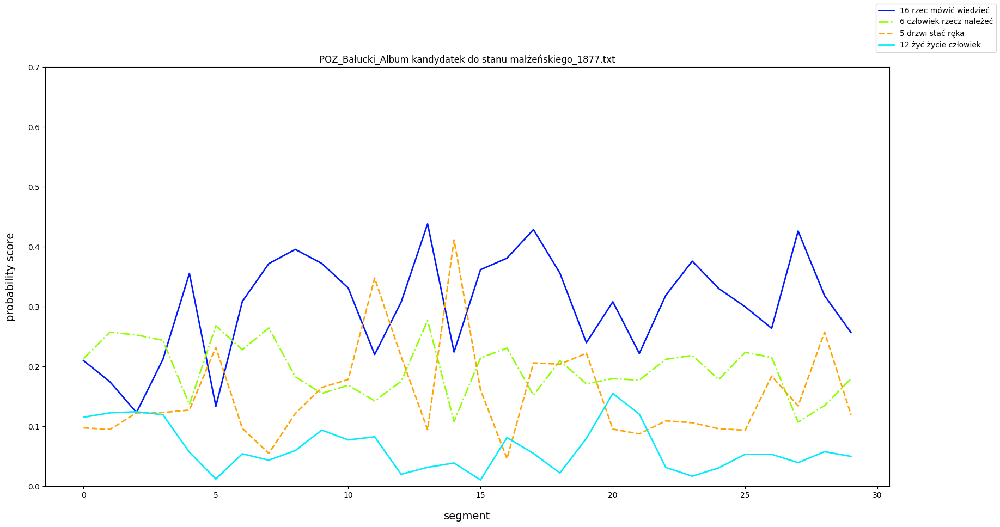

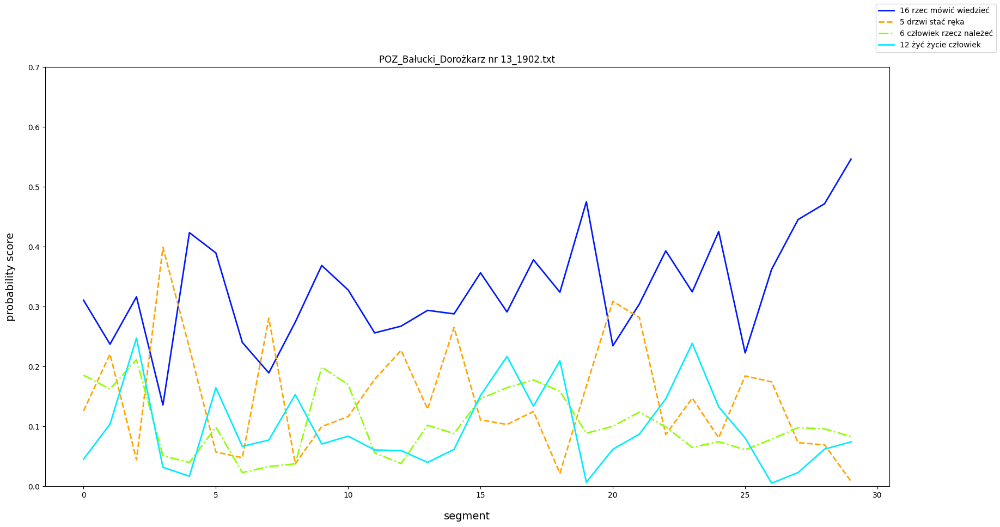

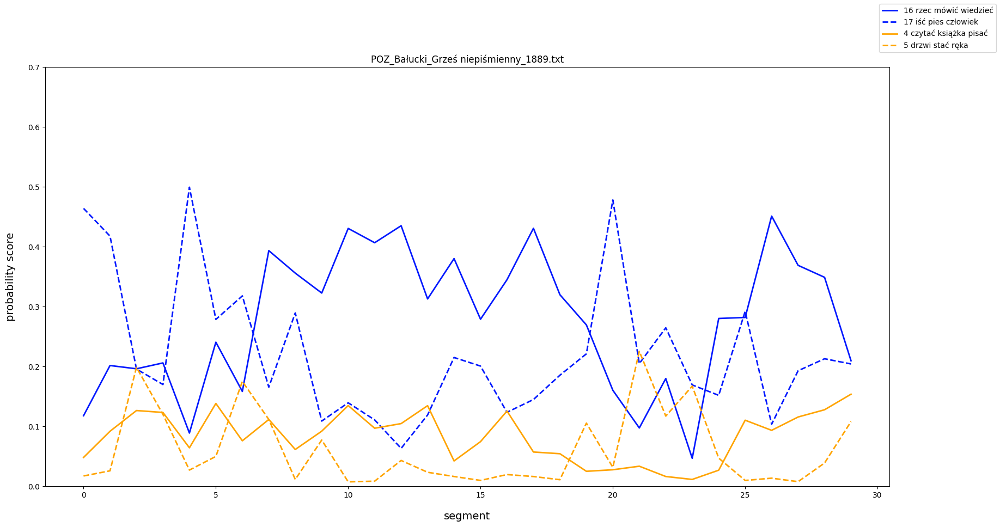

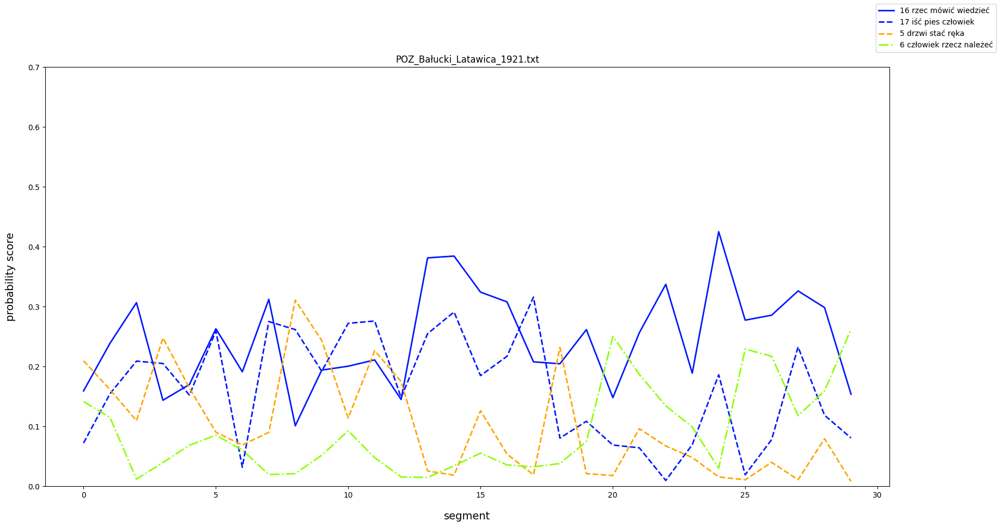

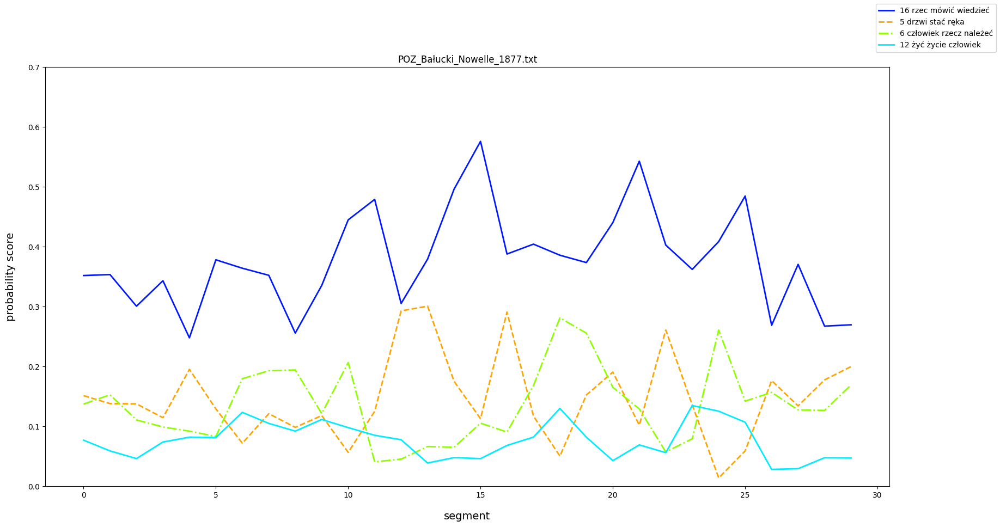

...

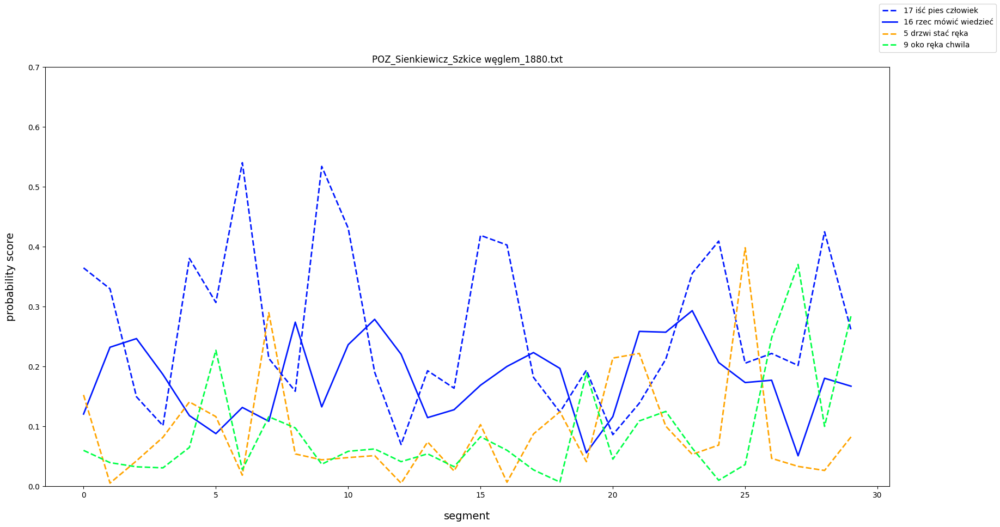

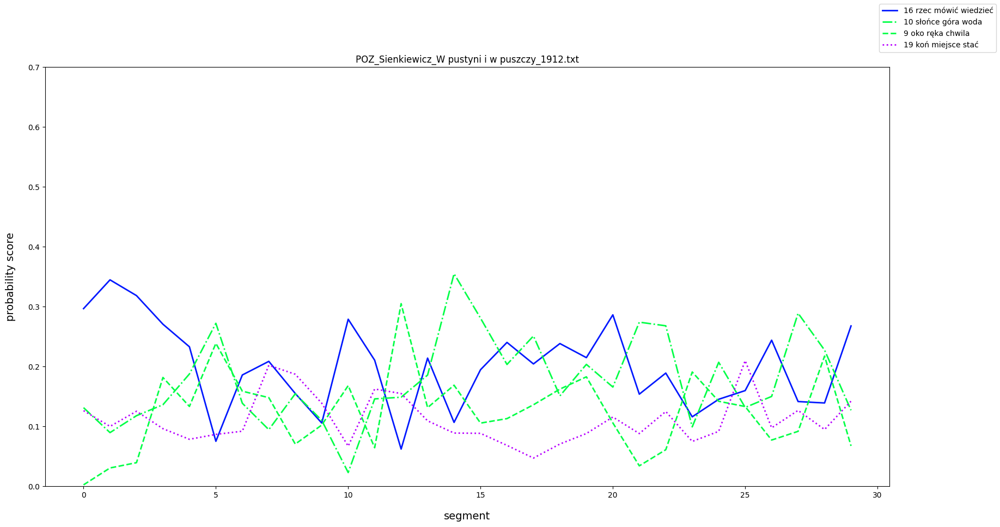

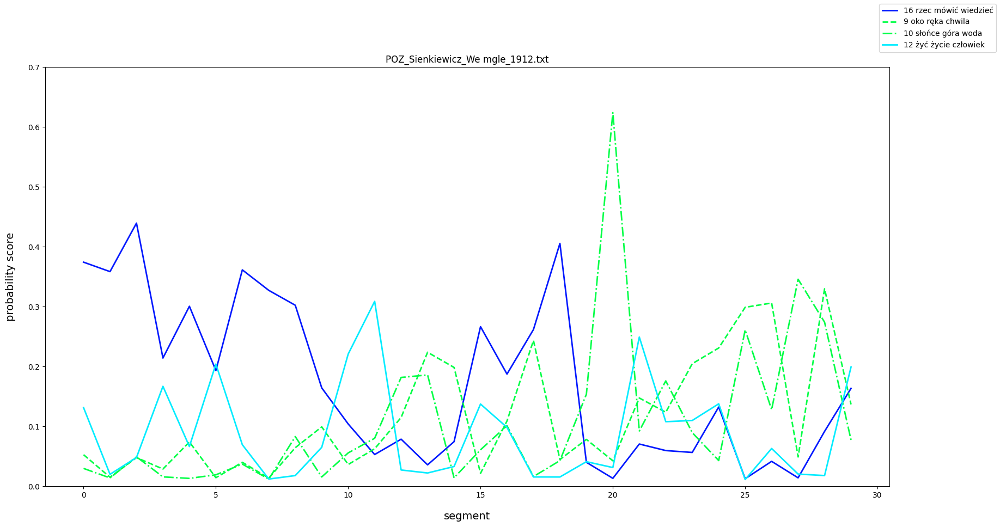

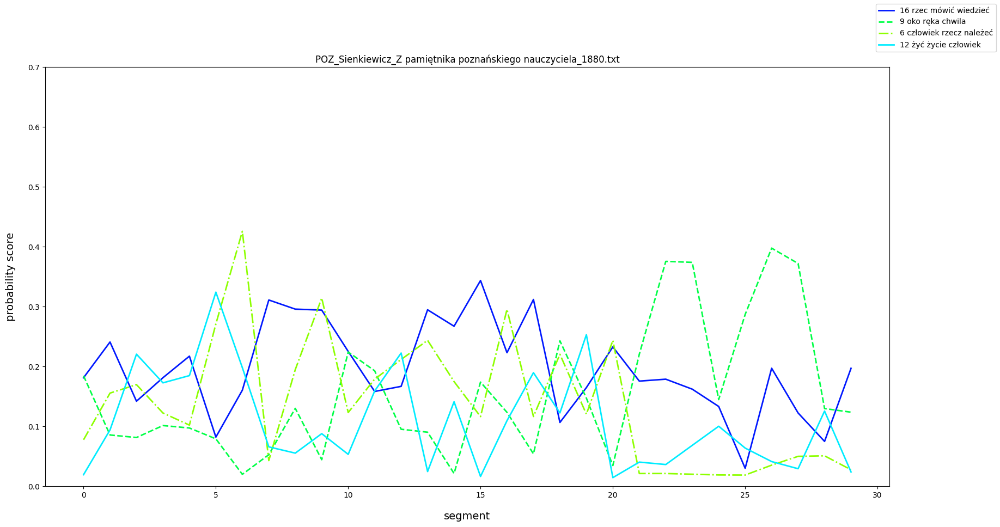

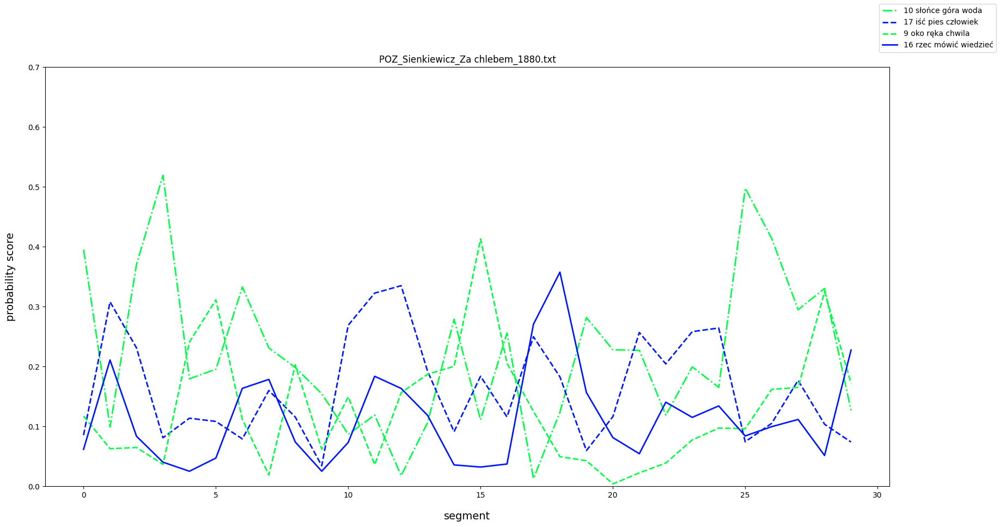

In [80]:
for textno in tqdm(range(0, len(data_lemmatized))):
    
    NUM_COLORS = 20
    NUM_STYLES=4
    LINE_STYLES = ['solid', 'dashed', 'dashdot', 'dotted']

    cm = plt.get_cmap('gist_rainbow')
    fig = plt.figure(figsize=(20,10))
    ax = fig.add_subplot(111)
    ax.set_ylim(0, 0.7)
    ax.set_title(labels[textno])
    ax.set_xlabel('segment', labelpad=16, fontsize=14)
    ax.set_ylabel('probability score', labelpad=16, fontsize=14)
    for i in dom_topics[textno][:4]:
        lines = ax.plot(wyniki[textno][i])
        lines[0].set_color(cm(i//3*3.0/NUM_COLORS))
        lines[0].set_linewidth(2)
        lines[0].set_linestyle(LINE_STYLES[i%NUM_STYLES])
        
    #fig.legend(keywords3, loc='upper right')
    #fig.legend(range(0,20), loc='upper right')
    legend=[]
    for i in dom_topics[textno]:
        legend.append(str(i)+ ' '+' '.join(topicwords[i][:3])) #i-1: index starts with 0
    fig.legend(legend)
    #loc='upper left', shadow=True, ncol=1)
    fig.savefig(labels[textno]+'.png')
    plt.show()

In [ ]:
dom_topics[0]

  0%|          | 0/88 [00:00<?, ?it/s]

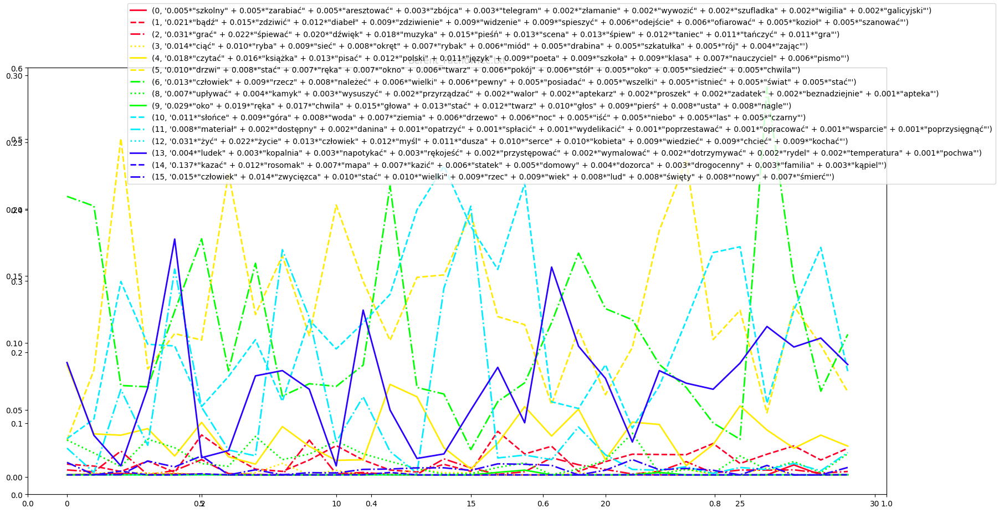

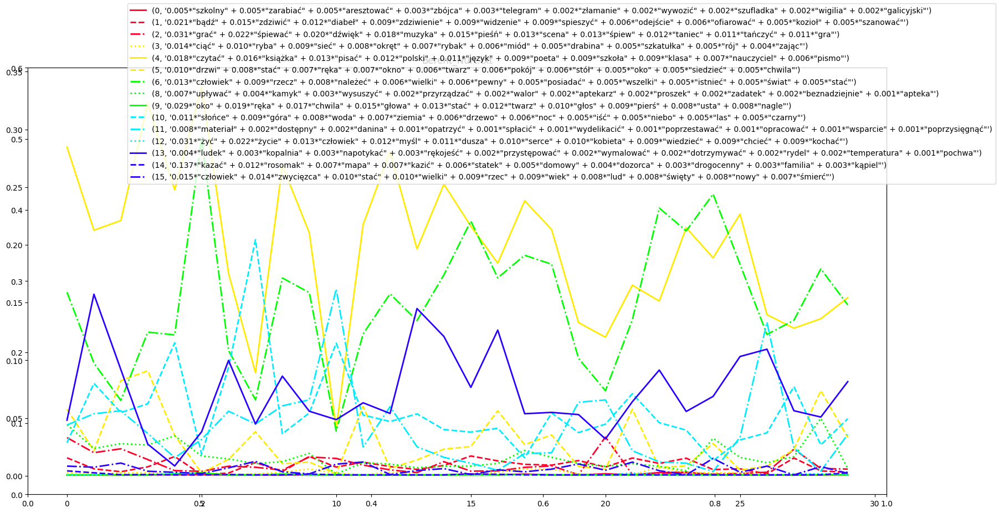

KeyboardInterrupt: 

In [130]:
for textno in tqdm(range(0, len(data_lemmatized))):
    
    wyniki=[]
    for topicno in range(0,15):
        wyniki.append(rolling_topic_gensim(data_lemmatized[textno], topicno, 30))
    
    NUM_COLORS = 15
    NUM_STYLES=4
    LINE_STYLES = ['solid', 'dashed', 'dashdot', 'dotted']

    cm = plt.get_cmap('gist_rainbow')
    fig = plt.figure(figsize=(20,10))
    plt.ylim(0, 0.6)
    ax = fig.add_subplot(111)
    ax.set_title(labels[textno])
    for i in range(NUM_COLORS):
        lines = ax.plot(wyniki[i])
        lines[0].set_color(cm(i//3*3.0/NUM_COLORS))
        lines[0].set_linewidth(2)
        lines[0].set_linestyle(LINE_STYLES[i%NUM_STYLES])
    #fig.legend(keywords3, loc='upper right')
    #fig.legend(range(0,20), loc='upper right')
    fig.legend(keyw)
    #loc='upper left', shadow=True, ncol=1)
    fig.savefig(labels[textno]+'.png')
    plt.show()

In [34]:
for bookno in range(0,len(data_lemmatized)-1):
    filename="C:/PAN2/mlodapolska+nietzsche_lemmatized/"+labels[bookno]
    with open(filename, 'w', encoding='utf-8') as file:
        for word in data_lemmatized[bookno]:
            file.write(word+" ")

In [60]:
keyw=lda_model.print_topics()
keyw.sort()

In [61]:
labels[51]

'Reymont_Ziemia obiecana.txt'

In [62]:
len(wyniki[51][0])

IndexError: list index out of range

In [13]:
no_steps=30
chunks=[]

text=data_lemmatized[0]

step=int(len(text)/no_steps)
window_size=int(len(text)/(no_steps-1))

for counter in range(no_steps):
    chunk=[]
    chunk=text[counter*step:(counter*step+window_size)]
    chunks.append(chunk)

In [14]:
chunks[10]

['kołek',
 'sprawa',
 'szkolny',
 'stopień',
 'sprawować',
 'sprawowanie',
 'wielki',
 'zwykle',
 'życzliwość',
 'przyznać',
 'dostać',
 'pałka',
 'zwykle',
 'klepać',
 'współczuć',
 'współczucie',
 'twarz',
 'chłopak',
 'robić',
 'duch',
 'wyrzut',
 'zajmować',
 'wpadać',
 'tępy',
 'rozmyślać',
 'rozmyślanie',
 'wnet',
 'spostrzec',
 'dobry',
 'ciągnąć',
 'rękaw',
 'powtarzać',
 'raz',
 'wiedzieć',
 'chcieć',
 'piłka',
 'portmonetka',
 'złotówka',
 'obsypać',
 'pocałunek',
 'zaczynać',
 'prosząco',
 'duszka',
 'musieć',
 'koniecznie',
 'zostać',
 'położyć',
 'spad',
 'zasnąć',
 'zgodzić',
 'rad',
 'postanowić',
 'postanowienie',
 'rozgadać',
 'dobry',
 'wiedzieć',
 'pytać',
 'pacierz',
 'mówić',
 'gniewać',
 'ochota',
 'pacierz',
 'mowa',
 'duszka',
 'młody',
 'wyrywać',
 'fachowiec',
 'ulica',
 'mokro',
 'wilgotno',
 'ślimaczno',
 'chwila',
 'zawahać',
 'dom',
 'potęgować',
 'przykry',
 'usposobić',
 'usposobienie',
 'naprowadzać',
 'gorycz',
 'bezwiednie',
 'skrzywiać',
 'usta',
 'g

In [13]:
for counter in range(len(labels)):
    print(counter, ', ', labels[counter])

0 ,  Berent_Fachowiec.txt
1 ,  Berent_Nurt.txt
2 ,  Berent_Ozimina.txt
3 ,  Berent_Prochno.txt
4 ,  Grabinski_Bledny pociag.txt
5 ,  Grabinski_Cien Bafometa.txt
6 ,  Grabinski_Salamandra.txt
7 ,  Lange_Elfryda - Nowele i fantazje.txt
8 ,  Lange_Nowy Tarzan - Opowiadania wesole i niewesole.txt
9 ,  Lange_W czwartym wymiarze - opowiadania.txt
10 ,  Lesmian_Klechdy polskie.txt
11 ,  Lesmian_Klechdy sezamowe.txt
12 ,  Lesmian_Przygody Sindbada Zeglarza.txt
13 ,  Licinski_Halucynacje.txt
14 ,  Licinski_Z pamietnika wloczegi.txt
15 ,  Micinski_Nietota.txt
16 ,  Micinski_Xiadz Faust.txt
17 ,  Mirandola_Tempore belli.txt
18 ,  Mirandola_Tropy.txt
19 ,  Nietzsche_Antychryst_Staff.txt
20 ,  Nietzsche_Dytyramby dionizyjskie.txt
21 ,  Nietzsche_Ecce homo_Staff.txt
22 ,  Nietzsche_Jutrzenka_Wyrzykowski.txt
23 ,  Nietzsche_Ludzkie, arcyludzkie t.txt
24 ,  Nietzsche_Narodziny tragedii_Staff.txt
25 ,  Nietzsche_Niewczesne rozwazania_Staff.txt
26 ,  Nietzsche_Poza dobrem i zlem_Wyrzykowski.txt
27 ,  Ni

In [14]:
# find all occurrences of topic
def getOccs(terms,text, start=0,end=-1):
    termDict = dict()
    for term in terms:
        termDict.setdefault(term, [])
        [ termDict[term].append(i) for i,item in enumerate(text[start:end]) if item == term ]
    return termDict

In [15]:
def getConc(inds,text,window=5):#TODO: chunk można zdefiniować już tu
    concordance = []
    indexes = [ (ind - window, ind + window) for ind in inds ]
    for position in indexes:
        concordance.append(
            (position , ' '.join(text[position[0]:position[1]]) )
            )
    return concordance
#getConc([16,35,100],data_lemmatized[0])

In [17]:
occs = getOccs([i[0] for i in lda_model.show_topic(6)],data_lemmatized[6])

# print occs of the topic terms
counter=0

for term in occs.keys():
    print('===' ,term, '===\n')
    concord = getConc(occs[term],data_lemmatized[6]) #TODO: ref do niezlemmatyzowanego korpus + ref do chunku, np. data_nonlemmatized[0][1:1000]
    for line in concord:
        print(','.join([str(l) for l in line[0]]) + ":" , line[1] + '\n' )
    counter=counter+1
    if counter==3:
        break

=== człowiek ===

-3,7: 

63,73: los pierwszy karta tajemniczy obchodzić człowiek miesiąc ciągle spotykać rozmaity

73,83: punkt miasto obchodzić szczupły wysoki człowiek wichura siwy włos wytrzeć

114,124: szaroniebieski oko zatopić przestrzeń dziwny człowiek popychać tajemniczy ogół wiedzieć

191,201: żelazny przęsło nurt pienić dół człowiek rybacki bluza ostro zacięty

259,269: zajść daleki perspektywa wypadek pewny człowiek zdawać zupełnie sprawa znać

521,531: usta ilekroć mówić działać ujmująco człowiek budzić pierwszy słowo sympatia

733,743: zwykle powstawać powstawać towarzystwo dziwny człowiek swobodny obecność krępować zupełnie

1018,1028: obcy raz dziwaczny zgrupować zgrupowanie człowiek most obecność własny osoba

1603,1613: dostojnik rzec rzec półgłosem pozdrawiać człowiek most hidalga przejść dama

1618,1628: wydać znajomy raz żyć życie człowiek przypomnieć wodzirej zarządzić zmiana

2081,2091: dziwny przypadek wiedzieć oglądać wyleczyć człowiek doktorski dyplom umilknąć

In [45]:
len(data_lemmatized[2])/30*28

32926.13333333333

In [43]:
for counter in range(0,30):
    print(counter, ' ', wyniki[2][17][counter])

0   0.023937033
1   0.028482866
2   0.022580713
3   0.055178475
4   0.06718501
5   0.045790408
6   0.07701533
7   0.10184941
8   0.054665606
9   0.034828898
10   0.019533908
11   0.03445176
12   0.05666155
13   0.06106525
14   0.07349803
15   0.010219065
16   0.067490295
17   0.03697797
18   0.043788213
19   0.08093842
20   0.0404799
21   0.054832835
22   0.062307183
23   0.08089677
24   0.048939496
25   0.16063134
26   0.11311524
27   0.102616474
28   0.20989467
29   0.028981587
